In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

from scipy.ndimage.interpolation import zoom
from PIL import Image
from scipy.misc import imsave
import glob
from os.path import basename

# Read data

In [2]:
def convert_coordinate_to_pixel(x,y,n_rows,n_cols):
    return int(x*n_rows), int(y*n_cols)

In [3]:
def plot_with_label(im_array, x, y):
    x = float(x)
    y = float(y)
        
    im_array = np.asarray(im_array)
        
    center_point_x, center_point_y = convert_coordinate_to_pixel(x,y,im_array.shape[1], im_array.shape[0])
        
    fig,ax = plt.subplots(1)
    ax.set_aspect('equal')
    ax.scatter([center_point_x], [center_point_y], s=5, c="r")
    ax.add_patch(Circle((center_point_x, center_point_y), 0.05*np.min([im_array.shape[1], im_array.shape[0]]), fill=False))
    ax.imshow(im_array)
    plt.show()

In [4]:
def load_data(path, labels):
    # returns list with (image_matrix, x, y)
    
    data = list()
    data_label = list()
    for label in labels:
        x = float(label[1])
        y = float(label[2])
        
        image = Image.open(path + label[0])
        image.load()
        im_array = np.asarray(image)
        
        
        data.append(im_array)
        data_label.append([x,y])
        

    return np.asarray(data)/255, np.asarray(data_label)

In [5]:
path = "D:\\PythonProjects\Brain\\find_phone_task\\find_phone\\"


lines = [line.rstrip('\n') for line in open(path + "labels.txt")]
labels = list()

for line in lines:
    labels.append(line.split(" "))

In [6]:
data, data_label = load_data(path, labels)

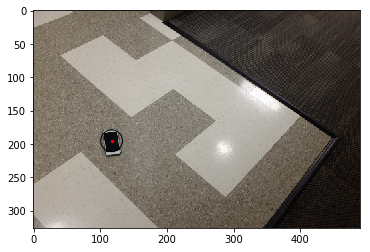

In [8]:
k = 0
plot_with_label(data[k], data_label[k,0], data_label[k,1])

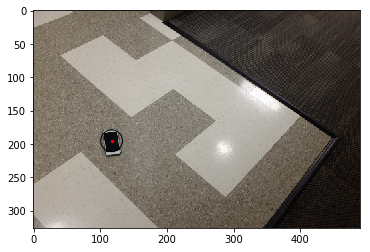

(103, 2)
(20, 2)
(6, 2)


In [9]:
split = int(data.shape[0]*0.8)
train_data = data[:split]
validation_data = data[split:]

split_v = int(validation_data.shape[0]*0.8)
test_data = validation_data[split_v:]
validation_data = validation_data[:split_v]

train_label = data_label[:split]
validation_label = data_label[split:]
test_label = validation_label[split_v:]
validation_label = validation_label[:split_v]

plot_with_label(train_data[k], train_label[k,0], train_label[k,1])

n_rows = train_data.shape[0]
n_cols = train_data.shape[1]
print(train_label.shape)
print(validation_label.shape)
print(test_label.shape)

# Data augmentation

### Define Data augmentation

In [10]:
def translate_random(im, x, y, n):
    # Translates image randomly n times and folds background back on other side
    c = 1
    result = list()
    result_label = list()
    result.append(im)
    result_label.append([x,y])
    while c < n+1:
        x_translation = (np.random.rand()-0.5)*2
        y_translation = (np.random.rand()-0.5)*2
        
        offset_x = 0.05
        offset_y = 0.05
        if x - x_translation > offset_x and x - x_translation < 1-offset_x and y - y_translation > offset_y and y - y_translation < 1-offset_y:
            result_label.append([x-x_translation,y-y_translation])
            
            x_translation, y_translation = convert_coordinate_to_pixel(y_translation, x_translation, im.shape[0], im.shape[1])
            new_im = np.roll(im, -y_translation, axis=1)
            new_im = np.roll(new_im, -x_translation, axis=0)
            
            result.append(new_im)
            c+=1
            
    return result, result_label

In [11]:
def scale_random(im, x, y, n, order = 1):
    def clipped_zoom(img, zoom_factor, x, y, order = 1):
    
        h, w = img.shape[:2]

        # For multichannel images we don't want to apply the zoom factor to the RGB
        # dimension, so instead we create a tuple of zoom factors, one per array
        # dimension, with 1's for any trailing dimensions after the width and height.
        zoom_tuple = (zoom_factor,) * 2 + (1,) * (img.ndim - 2)

        # Zooming out
        if zoom_factor < 1:

            # Bounding box of the zoomed-out image within the output array
            zh = int(np.round(h * zoom_factor))
            zw = int(np.round(w * zoom_factor))
            top = (h - zh) // 2
            left = (w - zw) // 2

            # Zero-padding
            out = np.zeros_like(img)
            result_x = x*zoom_factor + left/out.shape[1]
            result_y = y*zoom_factor + top/out.shape[0]



            out[top:top+zh, left:left+zw] = zoom(img, zoom_tuple, order=order)



        # Zooming in
        elif zoom_factor > 1:

            # Bounding box of the zoomed-in region within the input array
            zh = int(np.round(h / zoom_factor))
            zw = int(np.round(w / zoom_factor))
            top = (h - zh) // 2
            left = (w - zw) // 2


            out = zoom(img[top:top+zh, left:left+zw], zoom_tuple, order=order)

            result_x = (x - left/out.shape[1])*zoom_factor 
            result_y = (y - top/out.shape[0])*zoom_factor  

            # `out` might still be slightly larger than `img` due to rounding, so
            # trim off any extra pixels at the edges
            trim_top = ((out.shape[0] - h) // 2)
            trim_left = ((out.shape[1] - w) // 2)
            out = out[trim_top:trim_top+h, trim_left:trim_left+w]

        # If zoom_factor == 1, just return the input array
        else:
            out = img
        return out, result_x, result_y
    
    k = 0
    result = list()
    result_label = list()
    result.append(im)
    result_label.append([x,y])
    while k < n:
        zoom_factor = np.random.rand()+0.75
        new_im, result_x, result_y = clipped_zoom(im,zoom_factor,x,y, order = order)
        if result_x > 0 and result_x < 1 and result_y > 0 and result_y < 1 and new_im.shape == im.shape:
            result.append(new_im)
            result_label.append([result_x, result_y])
        k += 1
            
    return result, result_label

In [12]:
def flip_along_all_axis(im, x, y):
    result = list()
    result_label = list()
    
    result.append(im)
    result_label.append([x,y])
    
    result.append(np.fliplr(im))
    result_label.append([1-x,y])
    
    result.append(np.flipud(im))
    result_label.append([x,1-y])
    
    result.append(np.fliplr(np.flipud(im)))
    result_label.append([1-x,1-y])
    
    return result, result_label

### Test augmentation methods

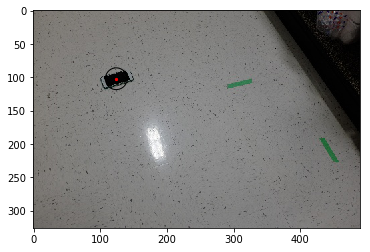

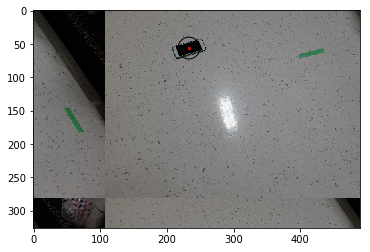

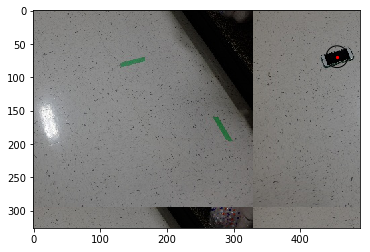

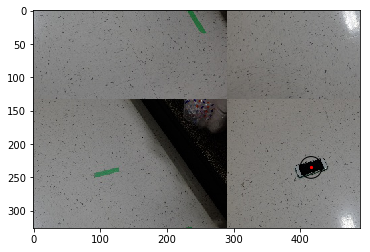

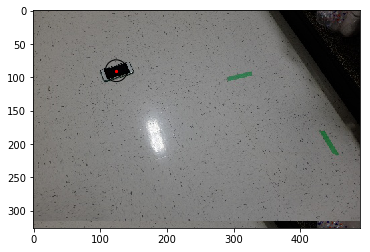

...

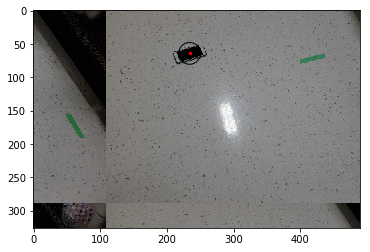

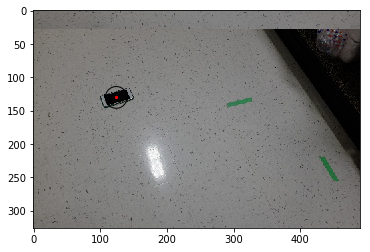

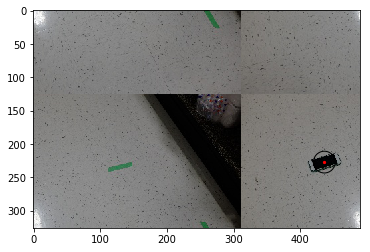

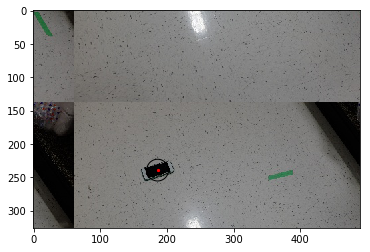

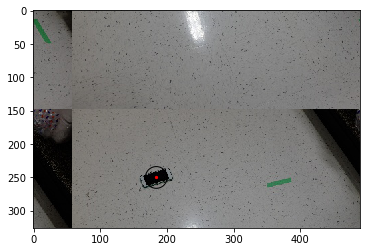

In [25]:
k = 1
n = 10
augmented_images, augmented_label = translate_random(train_data[k], train_label[k,0], train_label[k,1],n)
for i, im_ in enumerate(augmented_images):
    plot_with_label(im_, augmented_label[i][0], augmented_label[i][1])

C:\Users\Luca\Anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


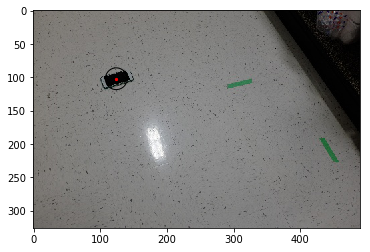

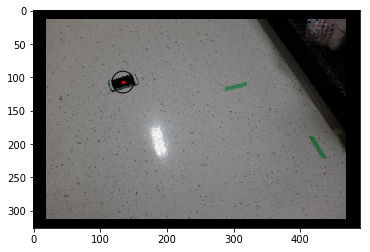

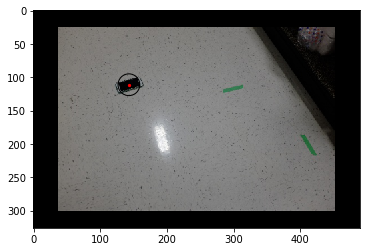

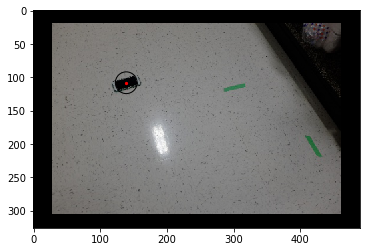

In [13]:
k = 1
n = 3
augmented_images, augmented_label = scale_random(train_data[k], train_label[k,0], train_label[k,1], n, order=1)
for i, im_ in enumerate(augmented_images):
    plot_with_label(im_, augmented_label[i][0], augmented_label[i][1])

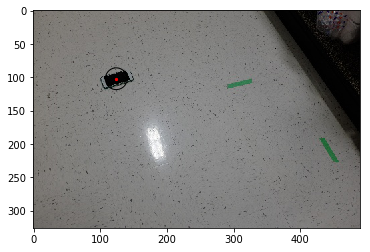

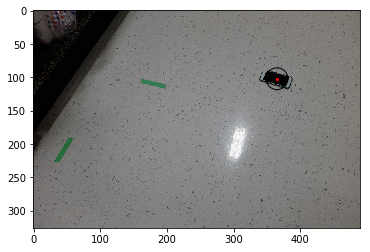

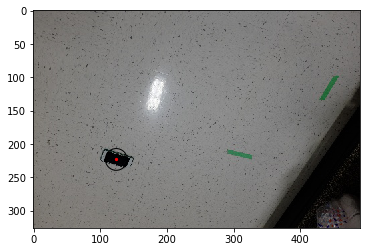

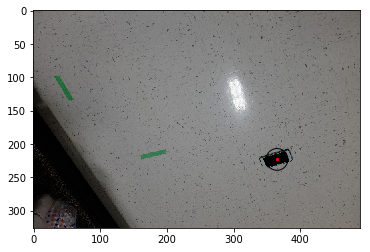

In [14]:
k = 1
augmented_images, augmented_label = flip_along_all_axis(train_data[k], train_label[k,0], train_label[k,1])
for i, im_ in enumerate(augmented_images):
    plot_with_label(im_, augmented_label[i][0], augmented_label[i][1])

### Apply augmentation

In [138]:
def augment_all(images, labels, n_translations=10, n_scales=1):
    result = list()
    result_label = list()
    for i, im in enumerate(images):
        #print(i)
        augmented_images, augmented_label = flip_along_all_axis(im, labels[i][0], labels[i][1])
        for k, im_ in enumerate(augmented_images):
            augmented_images_, augmented_label_ = translate_random(im_, augmented_label[k][0], augmented_label[k][1],n_translations)
            for s, im__ in enumerate(augmented_images_):
                augmented_images__, augmented_label__ = scale_random(im__, augmented_label_[s][0], augmented_label_[s][1], n_scales)
                result.extend(augmented_images__)
                result_label.extend(augmented_label__)
    return np.array(result), np.array(result_label)

def save_augmented_data(path, augmented_data, augmented_label, qualifier):
    for i in range(augmented_data.shape[0]):
        imsave(path + "data/" + qualifier + "_{0}.png".format(i), augmented_train_data[i])
        np.savetxt(path + "label/" + qualifier + "_{0}.txt".format(i), augmented_train_label[i])
        
def load_augmented_data(path, qualifier):
    augmented_data = list()
    augmented_label = list()
    
    for filename in glob.glob(path + "data/" + qualifier + "*.png"):
        im=np.array(Image.open(filename))
        im = im/255
        augmented_data.append(im)
        
        label = np.loadtxt(path + "label/" + basename(filename).split(".")[0] + ".txt")
        augmented_label.append(label)
        
    return np.array(augmented_data), np.array(augmented_label)


def get_generator_dicts(path):
    partition = {"train": [], "val": [], "test": []}
    labels = {}
    
    for filename in glob.glob(path + "data/train_*.png"):
        partition["train"].append(basename(filename).split(".")[0])
        
    for ID in partition["train"]:
        labels[ID] = np.loadtxt(path + "label/" + ID + ".txt")
        
        
    for filename in glob.glob(path + "data/val*.png"):
        partition["val"].append(basename(filename).split(".")[0])
        
    for ID in partition["val"]:
        labels[ID] = np.loadtxt(path + "label/" + ID + ".txt")
        
        
    for filename in glob.glob(path + "data/test*.png"):
        partition["test"].append(basename(filename).split(".")[0])
        
    for ID in partition["test"]:
        labels[ID] = np.loadtxt(path + "label/" + ID + ".txt")
        
    return partition, labels

In [139]:
#augmented_train_data, augmented_train_label = augment_all(train_data, train_label, n_translations=0, n_scales=0)
#save_augmented_data("./augmented_data/", augmented_train_data, augmented_train_label, "train")

#augmented_validation_data, augmented_validation_label = augment_all(validation_data, validation_label, n_translations=0, n_scales=0)
#save_augmented_data("./augmented_data/", augmented_validation_data, augmented_validation_label, "val")


#augmented_test_data, augmented_test_label = augment_all(test_data, test_label, n_translations=0, n_scales=0)
#save_augmented_data("./augmented_data/", augmented_test_data, augmented_test_label, "test")
      
augmented_train_data, augmented_train_label = load_augmented_data("./augmented_data/", "train")
#augmented_validation_data, augmented_validation_label = load_augmented_data("./augmented_data/", "val")
#augmented_test_data, augmented_test_label = load_augmented_data("./augmented_data/", "test")

partition_dict, labels_dict = get_generator_dicts("./augmented_data/")

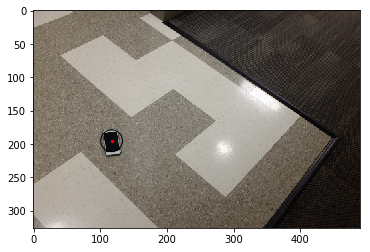

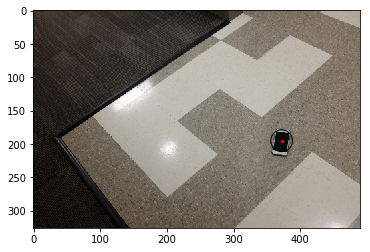

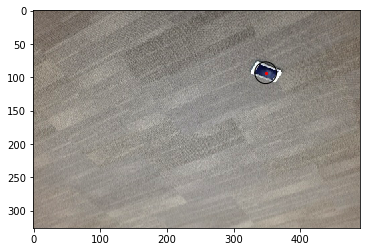

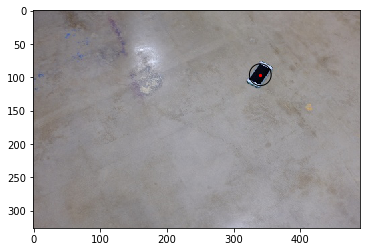

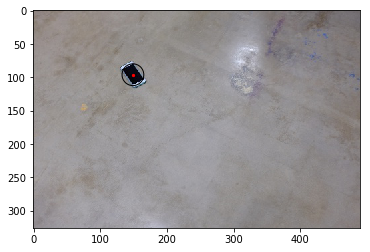

...

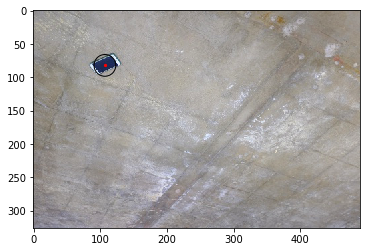

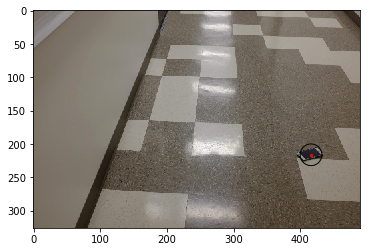

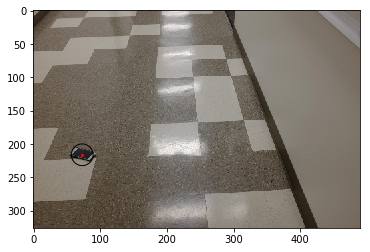

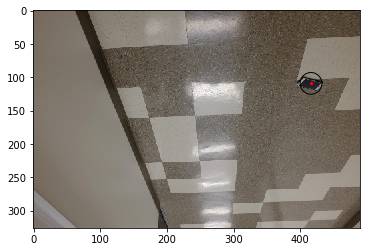

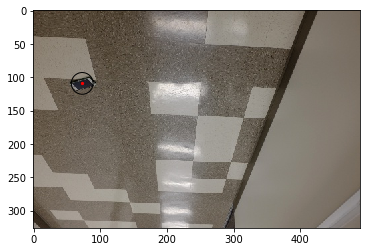

In [140]:
for i, im_ in enumerate(augmented_train_data[:20]):
    plot_with_label(im_, augmented_train_label[i][0], augmented_train_label[i][1])

# Train model

In [90]:
from keras import Model
from keras.models import load_model
from keras.layers import Conv2D, Input, Dense,Flatten,LeakyReLU
from keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping
from keras import backend as K
import tensorflow as tf
import keras
print(K.backend())

tensorflow


### Define data generator

In [65]:
class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, path, list_IDs, labels, batch_size=32, dim=(32,32,32), n_channels=3,
                  shuffle=True, fully_convolutional = True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.shuffle = shuffle
        self.on_epoch_end()
        self.path = path

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, 2), dtype=float)

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            X[i,] = imresize(np.array(Image.open(self.path + ID + '.png')), resize_factor)/255
            

            # Store class
            y[i,0], y[i,1] = self.labels[ID]
            

        return X, y

### Actual training

In [124]:
from scipy.misc import imresize
resize_factor = 1
augmented_train_data_resized = np.zeros((augmented_train_data.shape[0], imresize(augmented_train_data[0], resize_factor).shape[0], imresize(augmented_train_data[0], resize_factor).shape[1], 3))
augmented_validation_data_resized = np.zeros((augmented_validation_data.shape[0], imresize(augmented_validation_data[0], resize_factor).shape[0], imresize(augmented_validation_data[0], resize_factor).shape[1], 3))


for i, im in enumerate(augmented_train_data):
    augmented_train_data_resized[i] = imresize(im, resize_factor)/255
    

for i, im in enumerate(augmented_validation_data):
    augmented_validation_data_resized[i] = imresize(im, resize_factor)/255
    #plot_with_label(augmented_validation_data_resized[i], augmented_validation_label[i][0], augmented_validation_label[i][1])

C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  after removing the cwd from sys.path.
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimag

In [91]:
tbCallBack = TensorBoard(log_dir='./logs/regression', histogram_freq=2, batch_size=32, write_graph=True, write_grads=True, write_images=True)
cpCallBack = ModelCheckpoint('./checkpoints/regression/weights-improvement-{epoch:02d}-{val_loss:.2f}.hdf5', monitor='val_loss', verbose=0, save_best_only=False, save_weights_only=False, mode='auto', period=3)
esCallBack = EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=0, mode='auto')

K.clear_session()
sess = tf.Session()
K.set_session(sess)

In [99]:
input_img = Input(shape=(augmented_train_data_resized[0].shape[0], augmented_train_data_resized[0].shape[1], 3))

x = Conv2D(3, (1, 1), padding='same', use_bias=False)(input_img)
x = LeakyReLU(alpha=0.3)(x)
x = Conv2D(8, (3, 3), padding='same', use_bias=False)(x)
x = LeakyReLU(alpha=0.3)(x)
x = Conv2D(8, (3, 3), padding='same', use_bias=False)(x)
x = LeakyReLU(alpha=0.3)(x)
x = Conv2D(1, (1, 1), padding='same', use_bias=False)(x)
x = LeakyReLU(alpha=0.3)(x)
x = Flatten()(x)
x = Dense(8, activation='relu', use_bias=False)(x)


output = Dense(2, use_bias=False)(x)

model = Model(inputs=input_img, outputs=output)

from keras import optimizers
#sgd = optimizers.SGD(lr=1e-11, decay=1e-6, momentum=0.9, nesterov=True, clipnorm=1e-9)
model.compile(optimizer="adam", loss='mean_squared_error')

#tbCallBack.set_model(model)
print(model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 195, 294, 3)       0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 195, 294, 3)       9         
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 195, 294, 3)       0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 195, 294, 8)       216       
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 195, 294, 8)       0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 195, 294, 8)       576       
_________________________________________________________________
leaky_re_lu_12 (LeakyReLU)   (None, 195, 294, 8)       0         
__________

In [104]:
params = {'dim': (augmented_train_data_resized[0].shape[0],augmented_train_data_resized[0].shape[1]),
          'batch_size': 32,
          'n_channels': 3,
          'shuffle': True}
training_generator = DataGenerator("./augmented_data/data/", partition_dict['train'], labels_dict, **params)
validation_generator = DataGenerator("./augmented_data/data/", partition_dict['val'], labels_dict, **params)

history = model.fit_generator(generator=training_generator, validation_data=[augmented_validation_data_resized, augmented_validation_label], epochs=3, callbacks=[cpCallBack, esCallBack])


#history = model.fit(augmented_train_data_resized, augmented_train_label, validation_data=[augmented_validation_data_resized, augmented_validation_label] ,epochs=1000, batch_size=32, callbacks=[tbCallBack])

Epoch 1/3


C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:47: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


12/12 [==============================] - 21s 2s/step - loss: 0.0616 - val_loss: 0.0723
Epoch 2/3
12/12 [==============================] - 20s 2s/step - loss: 0.0594 - val_loss: 0.0661
Epoch 3/3
12/12 [==============================] - 20s 2s/step - loss: 0.0587 - val_loss: 0.0650


[[0.31372672 0.3540114 ]
 [0.58158755 0.57966244]
 [0.30102277 0.3390979 ]
 [0.5329291  0.52610207]
 [0.38899338 0.4169491 ]
 [0.51664555 0.5259564 ]
 [0.37960857 0.4033079 ]
 [0.50809395 0.5124028 ]
 [0.46057686 0.47736713]
 [0.4700581  0.4838562 ]]


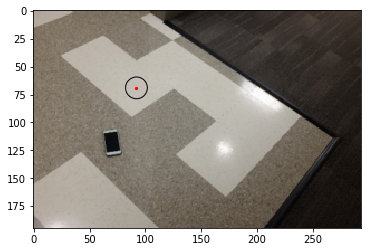

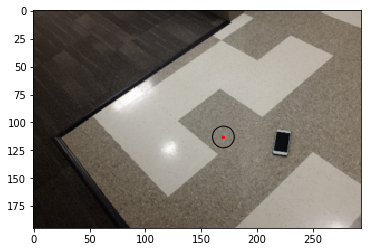

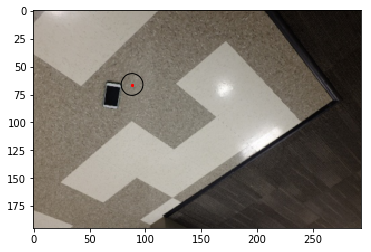

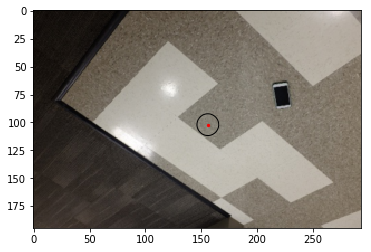

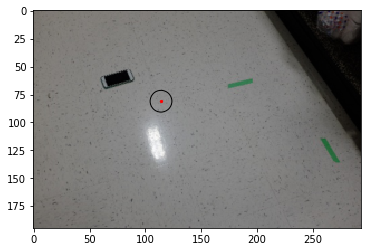

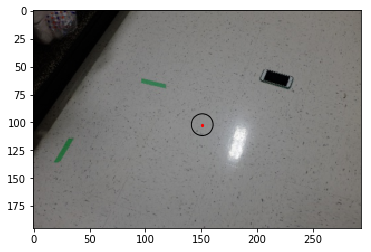

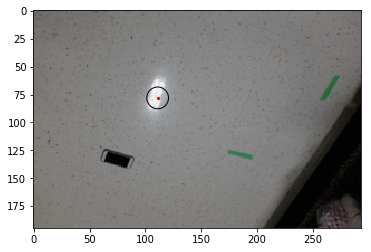

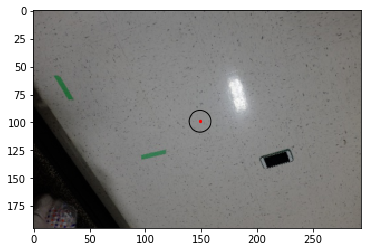

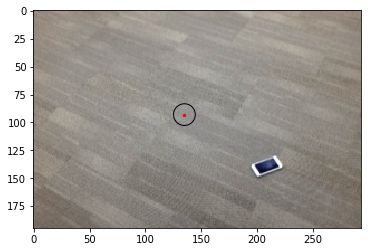

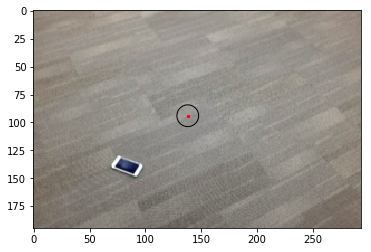

In [105]:
predictions = model.predict(augmented_train_data_resized[:10])
print(predictions)
for i, pred in enumerate(predictions):
    plot_with_label(augmented_train_data_resized[i], pred[0], pred[1])

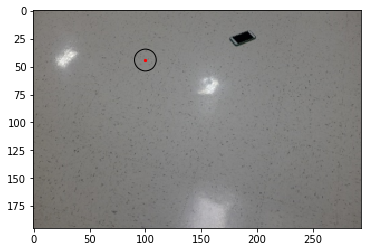

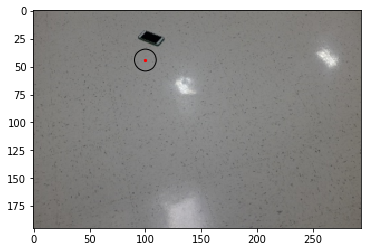

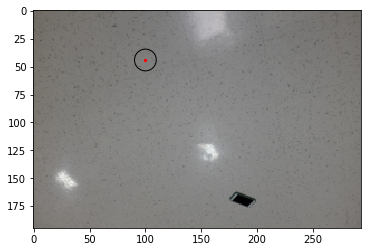

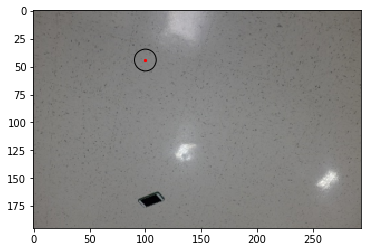

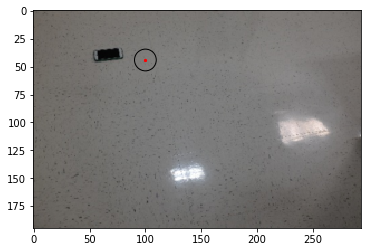

...

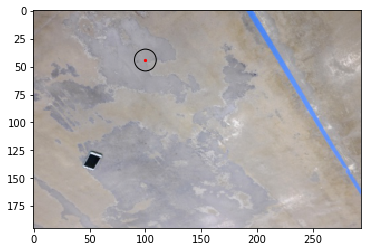

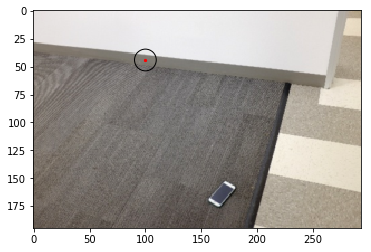

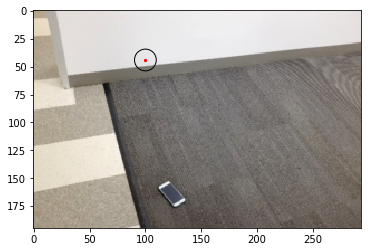

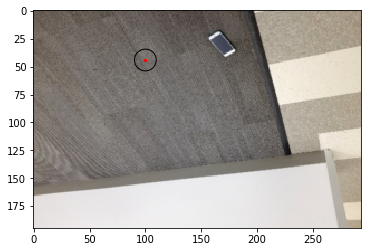

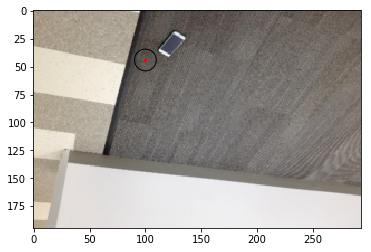

In [48]:
predictions = model.predict(augmented_validation_data_resized)
for i, pred in enumerate(predictions):
    plot_with_label(augmented_validation_data_resized[i], pred[0], pred[1])

# Fully convolutional approach

### Define help functions

In [106]:
def transform_label(x,y,n_rows,n_cols, width = 0.01):
    label = np.zeros((n_rows,n_cols))
    width_pixel = np.max([int(np.min([n_rows,n_cols])*width), 1])
    
    label[int(y*n_rows)-width_pixel:int(y*n_rows)+width_pixel, int(x*n_cols)-width_pixel:int(x*n_cols)+width_pixel] = 1
    return label

def evaluate_label(label):
    ys, xs = np.where(label == 1)
    xs = xs/label.shape[1]
    ys = ys/label.shape[0]
    return np.mean(xs), np.mean(ys)

In [107]:
class DataGeneratorFullyConvolutional(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, path, list_IDs, labels, batch_size=32, dim=(32,32,32), n_channels=3,
                 n_classes=2, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()
        self.path = path

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim, 1), dtype=int)
        
        

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            X[i,] = np.array(Image.open(self.path + ID + '.png'))
            
            
            # Store class
            y[i] = np.expand_dims(transform_label(self.labels[ID][0], self.labels[ID][1], n_rows, n_cols), axis=3)
            

        return X, y

### Prepare Data

In [121]:
augmented_train_label_fully_convolutional = np.array([transform_label(augmented_train_label[i][0], augmented_train_label[i][1], n_rows, n_cols) for i in range(augmented_train_label.shape[0])])

augmented_validation_label_fully_convolutional = np.array([transform_label(augmented_validation_label[i][0], augmented_validation_label[i][1], augmented_validation_data[0].shape[0], augmented_validation_data[0].shape[1]) for i in range(augmented_validation_label.shape[0])])

In [122]:
augmented_train_label_fully_convolutional = np.expand_dims(augmented_train_label_fully_convolutional, axis=3)

augmented_validation_label_fully_convolutional = np.expand_dims(augmented_validation_label_fully_convolutional, axis=3)

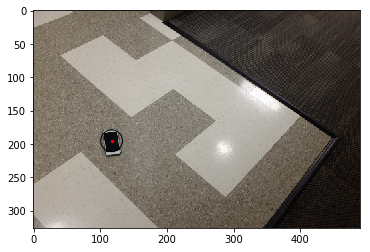

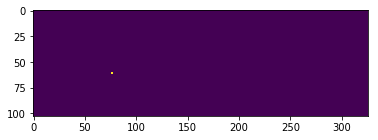

(0.6377551020408163, 0.12423312883435586)
0.6408 0.1258


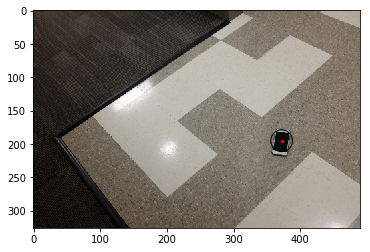

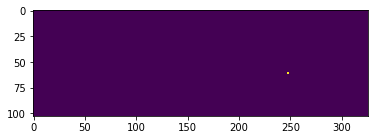

(0.2336734693877551, 0.1978527607361963)
0.2347 0.1994


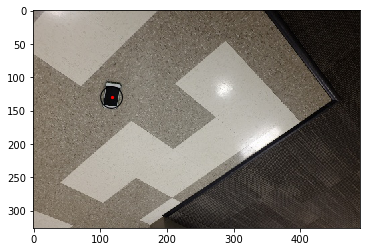

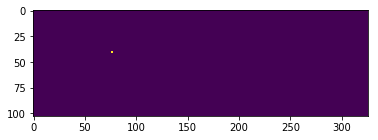

(0.3377551020408164, 0.44325153374233134)
0.3388 0.4448


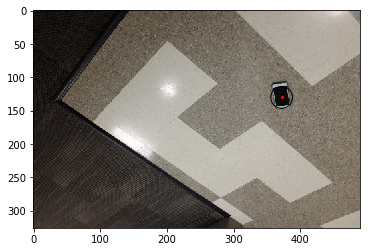

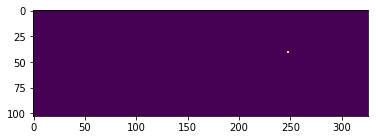

(0.32346938775510203, 0.4647239263803681)
0.3245 0.4663


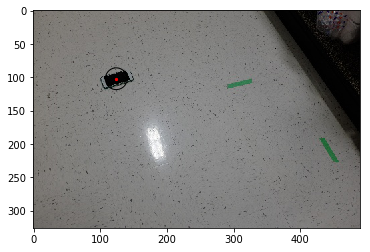

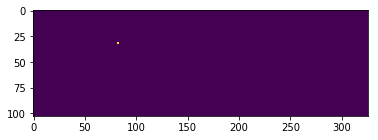

(0.14795918367346939, 0.35736196319018404)
0.151 0.3589


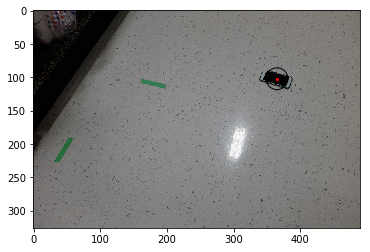

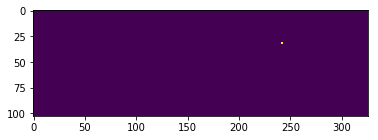

(0.1826530612244898, 0.7254601226993864)
0.1837 0.727


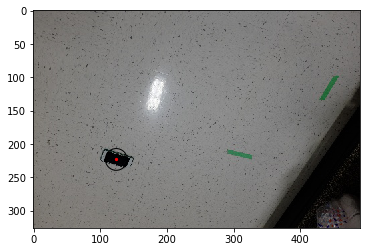

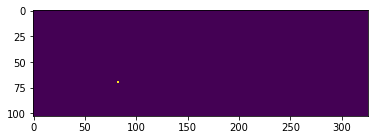

(0.5030612244897961, 0.21932515337423314)
0.5041 0.2239


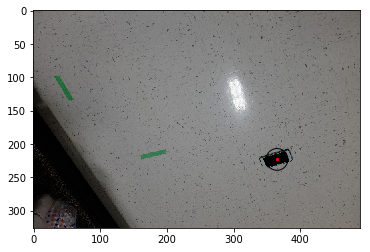

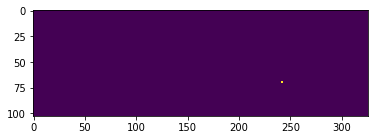

(0.8438775510204081, 0.21012269938650302)
0.8469 0.2117


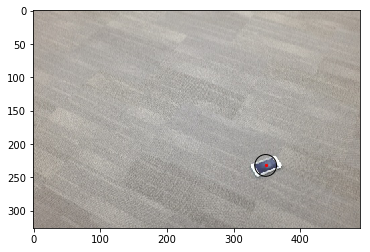

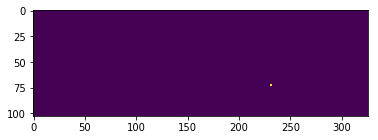

(0.11734693877551022, 0.5383435582822086)
0.1204 0.5399


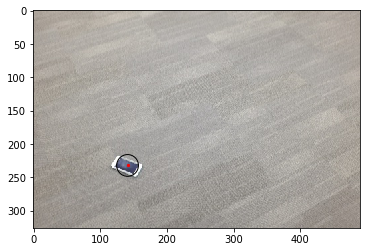

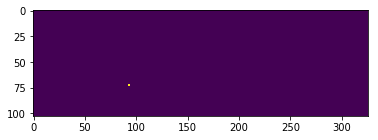

(0.26428571428571435, 0.5107361963190182)
0.2673 0.5123


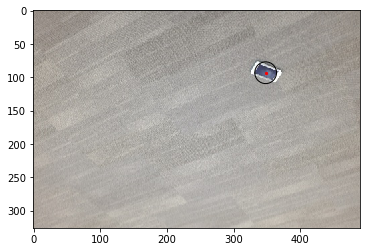

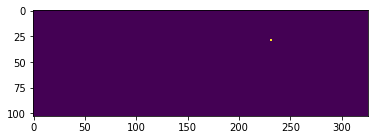

(0.3377551020408164, 0.7101226993865032)
0.3388 0.7147


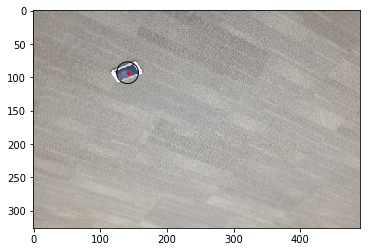

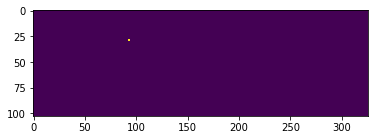

(0.41326530612244905, 0.6150306748466259)
0.4163 0.6196


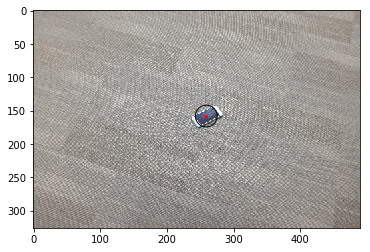

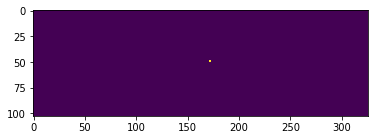

(0.4275510204081633, 0.6273006134969326)
0.4286 0.6319


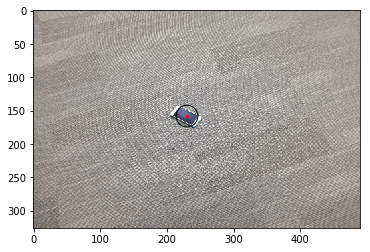

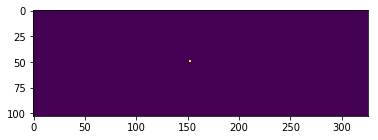

(0.1989795918367347, 0.6457055214723925)
0.2 0.6503


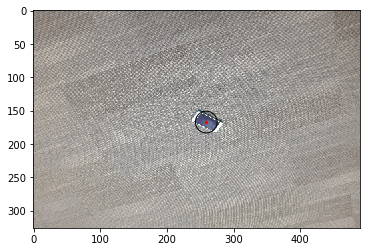

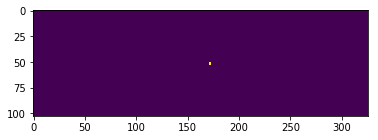

(0.14795918367346939, 0.36963190184049094)
0.149 0.3742


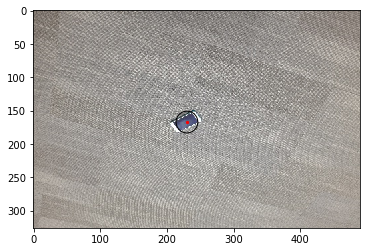

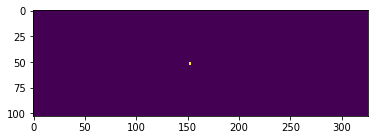

(0.6234693877551022, 0.4708588957055215)
0.6265 0.4724


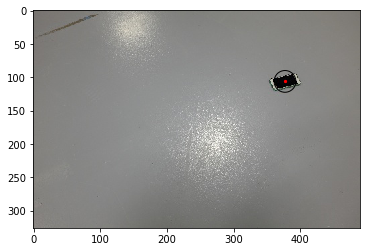

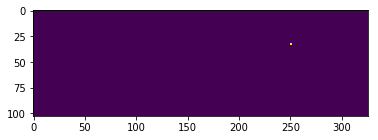

(0.8867346938775511, 0.8328220858895704)
0.8878 0.8374


KeyboardInterrupt: 

In [123]:
for i, label in enumerate(augmented_train_label_fully_convolutional):
    plot_with_label(augmented_train_data[i], augmented_train_label[i][0], augmented_train_label[i][1])
    plt.imshow(label.squeeze())
    plt.show()
    print(evaluate_label(transform_label(validation_label[i][0], validation_label[i][1], validation_data[i].shape[0], validation_data[i].shape[1])))
    print(validation_label[i][0], validation_label[i][1])

### Define Model

In [111]:
tbCallBack = TensorBoard(log_dir='./logs/fully_convolutional', histogram_freq=2, batch_size=32, write_graph=True, write_grads=True, write_images=True)
cpCallBack = ModelCheckpoint('./checkpoints/fully_convolutional/weights-improvement-{epoch:02d}-{val_loss:.2f}.hdf5', monitor='val_loss', verbose=0, save_best_only=False, save_weights_only=False, mode='auto', period=3)
esCallBack = EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=0, mode='auto')

K.clear_session()
sess = tf.Session()
K.set_session(sess)

In [112]:
input_img = Input(shape=(augmented_train_data[0].shape[0], augmented_train_data[0].shape[1], 3))

x = Conv2D(8, (1, 1), padding='same', activation='relu')(input_img)
x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
output = Conv2D(1, (1, 1), padding='same', activation='sigmoid')(x)


model_full_conv = Model(inputs=input_img, outputs=output)
model_full_conv.compile(optimizer='adam', loss='binary_crossentropy')

#tbCallBack.set_model(model)
print(model_full_conv.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 326, 490, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 326, 490, 8)       32        
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 326, 490, 32)      2336      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 326, 490, 32)      9248      
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 326, 490, 32)      9248      
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 326, 490, 1)       33        
Total params: 20,897
Trainable params: 20,897
Non-trainable params: 0
_________________________________________________________________
None


In [113]:
ys0, xs0 = np.where(augmented_train_label_fully_convolutional[0,:,:,0] == 0)
ys1, xs1 = np.where(augmented_train_label_fully_convolutional[0,:,:,0] == 1)

weights = np.zeros((32,2))
weights[:,0] = 1
weights[:,1] = ys0.shape[0] / ys1.shape[0]
print(ys0.shape[0] / ys1.shape[0])

8393.5


In [117]:
params = {'dim': (train_data[0].shape[0],train_data[0].shape[1]),
          'batch_size': 32,
          'n_classes': 2,
          'n_channels': 3,
          'shuffle': True}
training_generator = DataGeneratorFullyConvolutional("./augmented_data/data/", partition_dict['train'], labels_dict, **params)
validation_generator = DataGeneratorFullyConvolutional("./augmented_data/data/", partition_dict['val'], labels_dict, **params)

history = model_full_conv.fit_generator(generator=training_generator, validation_data=[augmented_validation_data, augmented_validation_label_fully_convolutional], epochs=6, callbacks=[tbCallBack, cpCallBack, esCallBack])

#history = model_full_conv.fit(augmented_train_data, augmented_train_label_fully_convolutional, validation_data=[augmented_validation_data, augmented_validation_label_fully_convolutional] ,epochs=6, batch_size=32, callbacks=[tbCallBack, cpCallBack, esCallBack], class_weight=weights)

Epoch 1/6


C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: DeprecationWarning: Both axis > a.ndim and axis < -a.ndim - 1 are deprecated and will raise an AxisError in the future.


StopIteration: could not broadcast input array from shape (103,326,1) into shape (326,490,1)

In [ ]:
istory = model_full_conv.fit(augmented_train_data, augmented_train_label_fully_convolutional, validation_data=[augmented_validation_data, augmented_validation_label_fully_convolutional] ,epochs=6, batch_size=32, callbacks=[tbCallBack, cpCallBack, esCallBack], sample_weights=weights)

In [ ]:
predictions = model_full_conv.predict(augmented_train_data[:10])
for i, pred in enumerate(predictions):
    pred = pred[:,:,0]
    pred[pred>0.5] = 1
    pred[pred<= 0.5] = 0
    pred_x, pred_y = evaluate_label(pred)
    
    plot_with_label(augmented_train_data[i], pred_x, pred_y)
    plt.imshow(pred)
    plt.show()

In [ ]:
predictions = model_full_conv.predict(augmented_validation_data[:10])
for i, pred in enumerate(predictions):
    pred = pred[:,:,0]
    pred[pred>0.5] = 1
    pred[pred<= 0.5] = 0
    pred_x, pred_y = evaluate_label(pred)
    plot_with_label(augmented_validation_data[i], pred_x, pred_y)
    
    plt.imshow(pred)
    plt.show()

# Use already trained model

In [ ]:
model_full_conv = load_model("./checkpoints/fully_convolutional/weights-improvement-02-0.71.hdf5")
predictions = loaded_model_full_conv.predict(augmented_train_data[:10])

predictions = model_full_conv.predict(augmented_validation_data[:10])
for i, pred in enumerate(predictions):
    pred = pred[:,:,0]
    pred[pred>0.5] = 1
    pred[pred<= 0.5] = 0
    pred_x, pred_y = evaluate_label(pred)
    plot_with_label(augmented_validation_data[i], pred_x, pred_y)
    
    plt.imshow(pred)
    plt.show()